<a href="https://colab.research.google.com/github/notabee/GANs/blob/master/hexagon_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import drive
drive.mount('./x')

Mounted at ./x


In [0]:
cd ./x/My\ Drive/

/content/x/My Drive


In [0]:
cd HegaxonCovers

/content/x/My Drive/HegaxonCovers


In [0]:
import glob
import cv2
import math
import numpy as np
import scipy
import matplotlib.pyplot as plt
from keras import layers
import keras
import imgaug.augmenters as iaa
import imgaug as ia

Using TensorFlow backend.


In [0]:
#image plotter

def plot_image(img):
    plt.figure(figsize=(5,5))
    plt.axis('off')
    plt.imshow(img)
    plt.show()

In [0]:
#horizontal flip

def flip_image(img):
    return img[:, ::-1]

In [0]:
#hue change
def huerotate_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV);
 
    hue = 180;
    saturation = 0;
    value = 0;
 
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            pix = img[x,y];
            pix[0] = (pix[0]+180);
 
            img[x,y] = pix;
 
    return cv2.cvtColor(img, cv2.COLOR_HSV2RGB);

In [0]:
#add gaussian noise

def noisy_image(img):
    row,col,ch= img.shape
    mean = 0
    var = 0.1
    sigma = var**0.5
    gauss = np.random.normal(mean,sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    img = cv2.add(img,gauss.astype('uint8'))
    return img

In [0]:
#white balance

def apply_mask(matrix, mask, fill_value):
    masked = np.ma.array(matrix, mask=mask, fill_value=fill_value)
    return masked.filled()

def apply_threshold(matrix, low_value, high_value):
    low_mask = matrix < low_value
    matrix = apply_mask(matrix, low_mask, low_value)

    high_mask = matrix > high_value
    matrix = apply_mask(matrix, high_mask, high_value)

    return matrix

def simplest_cb(img, percent):
    assert img.shape[2] == 3
    assert percent > 0 and percent < 100

    half_percent = percent / 200.0

    channels = cv2.split(img)

    out_channels = []
    for channel in channels:
        assert len(channel.shape) == 2
        # find the low and high precentile values (based on the input percentile)
        height, width = channel.shape
        vec_size = width * height
        flat = channel.reshape(vec_size)

        assert len(flat.shape) == 1

        flat = np.sort(flat)

        n_cols = flat.shape[0]

        low_val  = flat[math.floor(n_cols * half_percent)]
        high_val = flat[math.ceil( n_cols * (1.0 - half_percent))]
        # saturate below the low percentile and above the high percentile
        thresholded = apply_threshold(channel, low_val, high_val)
        # scale the channel
        normalized = cv2.normalize(thresholded, thresholded.copy(), 0, 255, cv2.NORM_MINMAX)
        out_channels.append(normalized)

    return cv2.merge(out_channels)

In [0]:
#make image list
sizee = 128
image_list = []
for file in glob.glob('./*.jpg'):
    img = cv2.cvtColor(cv2.resize(cv2.imread(file), (sizee,sizee)), cv2.COLOR_BGR2RGB)
    image_list.append(img)

In [0]:
# Imgaug augmentation Pipeline:

ia.seed(1)
sometimes = lambda aug: iaa.Sometimes(0.5, aug)

seq2 = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontally flip 50% of all images
    iaa.Crop(percent=(0, 0.1)), # random crops
    iaa.SomeOf((0, 5),
            [
                iaa.OneOf([
                    iaa.GaussianBlur((0, 3.0)), # blur images with a sigma between 0 and 3.0
                    iaa.AverageBlur(k=(2, 7)), # blur image using local means with kernel sizes between 2 and 7
                    iaa.MedianBlur(k=(3, 11)), # blur image using local medians with kernel sizes between 2 and 7
                ]),
                #iaa.AddToHueAndSaturation((-10, 10)), # change hue and saturation
                iaa.Sharpen(alpha=(0, 0.5), lightness=(0.75, 1.5)), # sharpen images
                #iaa.Emboss(alpha=(0, 0.5), strength=(0, 2.0)), # emboss images
                # search either for all edges or for directed edges,
                # blend the result with the original image using a blobby mask
                iaa.SimplexNoiseAlpha(iaa.OneOf([
                    iaa.EdgeDetect(alpha=(0.0, 0.5)),
                    iaa.DirectedEdgeDetect(alpha=(0.0, 0.5), direction=(0.0, 0.5)),
                ])),
                iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.02*255), per_channel=0.2), # add gaussian noise to images
                #iaa.OneOf([
                #    iaa.Dropout((0.01, 0.1), per_channel=0.5), # randomly remove up to 10% of the pixels
                #]),
                iaa.Add((-10, 10), per_channel=0.5), # change brightness of images (by -10 to 10 of original value)
                # either change the brightness of the whole image (sometimes
                # per channel) or change the brightness of subareas
                #iaa.OneOf([
                #    #iaa.Multiply((0.5, 1.5), per_channel=0.5),
                #    iaa.FrequencyNoiseAlpha(
                #        exponent=(-4, 0),
                #        first=iaa.Multiply((0.5, 1.5), per_channel=True),
                #        second=iaa.LinearContrast((0.5, 2.0))
                #    )
                #]),
                #iaa.LinearContrast((0.5, 2.0), per_channel=0.5), # improve or worsen the contrast
                #sometimes(iaa.ElasticTransformation(alpha=(0.5, 3.5), sigma=0.25)), # move pixels locally around (with random strengths)
                sometimes(iaa.PiecewiseAffine(scale=(0.005, 0.01))), # sometimes move parts of the image around
                sometimes(iaa.PerspectiveTransform(scale=(0.01, 0.1)))
            ]
        )
])


In [0]:
#apply augimg augmentation pipeline and print images

from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot

all_augmented_images = []
# load the image
for img in image_list:
  # convert to numpy array
  data = img_to_array(img).astype('uint8')
  # expand dimension to one sample
  samples = expand_dims(data, 0)
  # create image data augmentation generator
  datagen = ImageDataGenerator(preprocessing_function=seq2.augment_image)
  # prepare iterator
  it = datagen.flow(samples, batch_size=1)

  images = np.array(
      [data for _ in range(32)],
      dtype=np.uint8
  )

  images_aug = seq2(images=images)
  for i in range(32):
    #plot_image(images_aug[i]/255.0)
    all_augmented_images.append(images_aug[i])
print(len(all_augmented_images))

3328


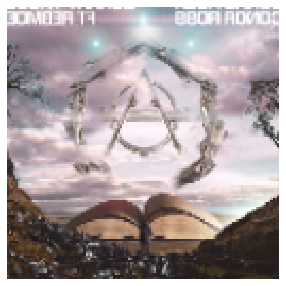

In [0]:
#check augmentations by plotting
plot_image(all_augmented_images[0])

In [0]:
latent_dim = 128 #dimensions of the random latent vectors
height =  sizee #height of image
width = sizee #width of image
channels = 3 #RGB

In [0]:
generator_input = keras.Input(shape=(latent_dim,)) #the shape of input layer to be feede in the model

x = layers.Dense(64 * 64 * 128)(generator_input) #connecting the input layer to a fully connected neural layer
x = layers.LeakyReLU()(x) #applying activation 
x = layers.Reshape((64, 64, 128))(x) #reshaping the activation output into a 3-d output of 16x16x128

x = layers.Conv2D(256, 5, padding='same')(x) #convolving over the previously reshaped 3-d output
x = layers.LeakyReLU()(x) #applying leaky_relu activation

x = layers.Conv2DTranspose(256, 4, strides=2, padding='same')(x) # transpose convolution for upsampling the previously convolved layer
x = layers.LeakyReLU()(x) #applying leaky_relu activation

# Few more conv layers
x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)
x = layers.Conv2D(256, 5, padding='same')(x)
x = layers.LeakyReLU()(x)

#convolving again to produce a output of shape of our image 32*32*3 with a tanh activation
x = layers.Conv2D(channels, 7, activation='tanh', padding='same')(x) 

#model
generator = keras.models.Model(generator_input, x)
generator.summary()




Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 524288)            67633152  
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 524288)            0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 256)       819456    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 64, 64, 256)       0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 128, 128, 256)     1

In [0]:
discriminator_input = layers.Input(shape=(height, width, channels))

x = layers.Conv2D(128, 3)(discriminator_input)
x = layers.LeakyReLU()(x)

x = layers.Conv2D(128, 4, strides=2)(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2D(128, 4, strides=2)(x)
x = layers.LeakyReLU()(x)

x = layers.Conv2D(128, 4, strides=2)(x)
x = layers.LeakyReLU()(x)

x = layers.Flatten()(x) #flattening the convoloved layer to connect it to a fully connected layer

x = layers.Dropout(0.4)(x) #dropouting to reduce overfitting

x = layers.Dense(1, activation='sigmoid')(x) #single output therefore a sigmoid would do

#model
discriminator = keras.models.Model(discriminator_input, x)
discriminator.summary()

##CLASSIFICATION TIME!!!

# using RMS(root mean square) optimizer 
# learning rate = 0.0008, clipping gradient with a limit of 1
# learning  decay rate = 10^(-8)
discriminator_optimizer = keras.optimizers.RMSprop(lr=0.0008, clipvalue=1.0, decay=1e-8)

# compiling over loss function i.e binary cross-entropy 
discriminator.compile(optimizer=discriminator_optimizer, loss='binary_crossentropy')


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 126, 126, 128)     3584      
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 126, 126, 128)     0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 62, 62, 128)       262272    
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 62, 62, 128)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 30, 30, 128)       262272    
_________

In [0]:
#freezing the training of discriminator just for the gan model "ONLY"
discriminator.trainable = False

#input shape for gan model
gan_input = keras.Input(shape=(latent_dim,))

#gan model
gan_output = discriminator(generator(gan_input))

#model
gan = keras.models.Model(gan_input, gan_output)

# using RMS(root mean square) optimizer 
# learning rate = 0.0008, clipping gradient with a limit of 1
# learning  decay rate = 10^(-8)
gan_optimizer = keras.optimizers.RMSprop(lr=0.0004, clipvalue=1.0, decay=1e-8)

# compiling over loss function i.e binary cross-entropy
gan.compile(optimizer=gan_optimizer, loss='binary_crossentropy')

In [0]:
iterations = 10000
batch_size = 8
from random import shuffle
X = all_augmented_images
shuffle(X)
x_train = np.asarray(X)
x_train.shape

(3328, 128, 128, 3)

In [0]:
x_train = x_train/255.0

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


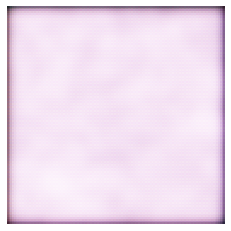

discriminator loss at step 0: 0.69587386
adversarial loss at step 0: 0.6742477


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


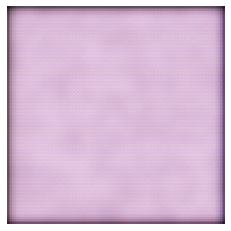

discriminator loss at step 10: 8.502756
adversarial loss at step 10: 1.00000015e-07


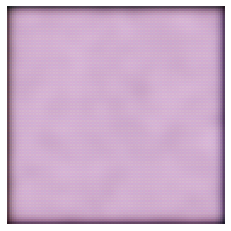

discriminator loss at step 20: 8.398359
adversarial loss at step 20: 1.00000015e-07


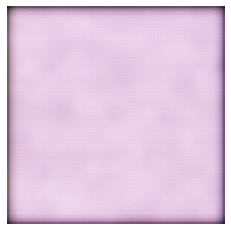

discriminator loss at step 30: 8.459795
adversarial loss at step 30: 1.00000015e-07


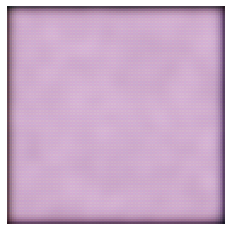

discriminator loss at step 40: 8.460899
adversarial loss at step 40: 1.00000015e-07


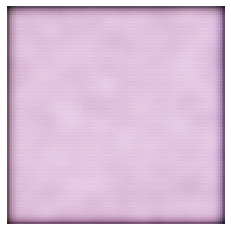

discriminator loss at step 50: 8.474598
adversarial loss at step 50: 1.00000015e-07


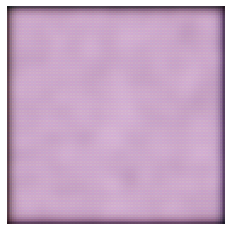

discriminator loss at step 60: 8.471549
adversarial loss at step 60: 1.00000015e-07


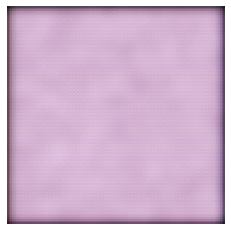

discriminator loss at step 70: 8.527326
adversarial loss at step 70: 1.00000015e-07


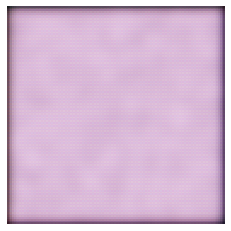

discriminator loss at step 80: 6.198049
adversarial loss at step 80: 15.942385


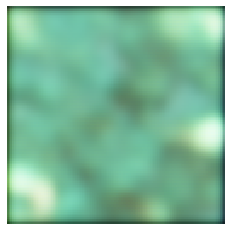

discriminator loss at step 90: 0.64039016
adversarial loss at step 90: 1.063458


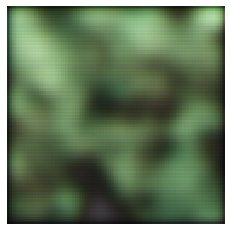

discriminator loss at step 100: 0.690042
adversarial loss at step 100: 0.6034698


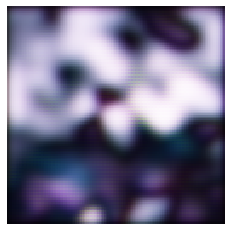

discriminator loss at step 110: 0.76894915
adversarial loss at step 110: 0.7755573


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


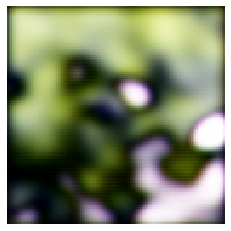

discriminator loss at step 120: 0.7300013
adversarial loss at step 120: 1.2472236


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


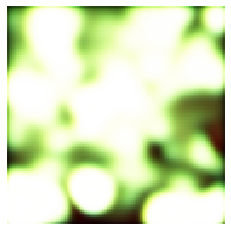

discriminator loss at step 130: 3.3310297
adversarial loss at step 130: 12.2618265


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


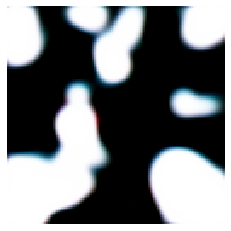

discriminator loss at step 140: 0.5100687
adversarial loss at step 140: 2.4880538


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


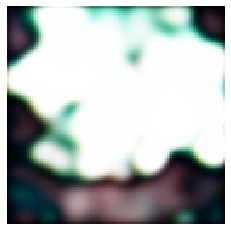

discriminator loss at step 150: 0.65313375
adversarial loss at step 150: 1.0024294


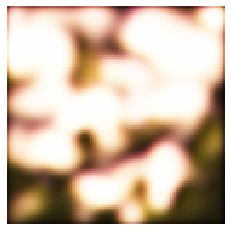

discriminator loss at step 160: 0.775335
adversarial loss at step 160: 0.75830054


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


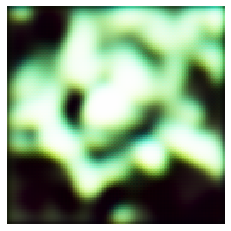

discriminator loss at step 170: 1.0173851
adversarial loss at step 170: 0.95574504


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


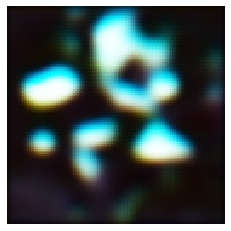

discriminator loss at step 180: 0.78927493
adversarial loss at step 180: 0.7342905


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


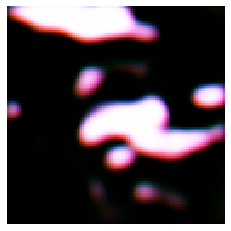

discriminator loss at step 190: 0.68761355
adversarial loss at step 190: 1.9692825


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


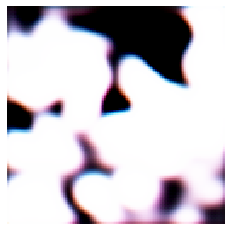

discriminator loss at step 200: 1.1431276
adversarial loss at step 200: 0.7047415


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


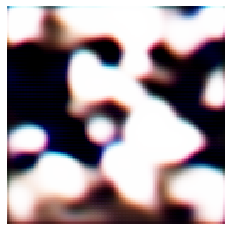

discriminator loss at step 210: 0.7026892
adversarial loss at step 210: 2.3440518


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


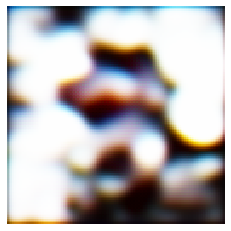

discriminator loss at step 220: 0.61420584
adversarial loss at step 220: 0.89613557


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


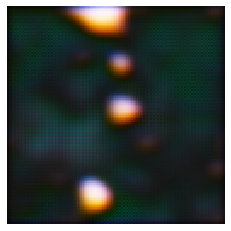

discriminator loss at step 230: 0.81627357
adversarial loss at step 230: 0.9173745


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


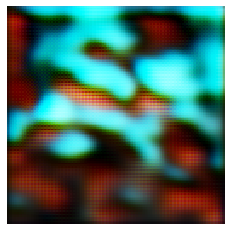

discriminator loss at step 240: 0.6784799
adversarial loss at step 240: 0.88778126


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


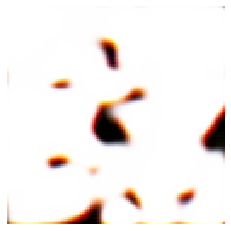

discriminator loss at step 250: 0.77694046
adversarial loss at step 250: 3.0502434


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


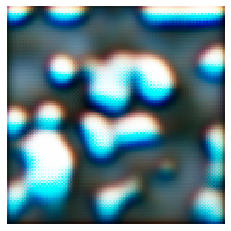

discriminator loss at step 260: 0.6366451
adversarial loss at step 260: 0.96329474


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


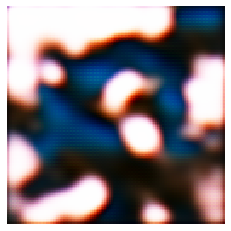

discriminator loss at step 270: 0.8663016
adversarial loss at step 270: 1.0351315


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


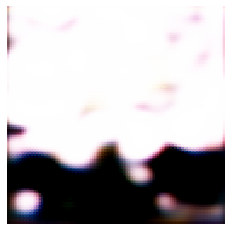

discriminator loss at step 280: 1.1900723
adversarial loss at step 280: 1.9317712


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


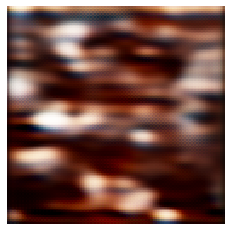

discriminator loss at step 290: 0.65710074
adversarial loss at step 290: 1.2069153


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


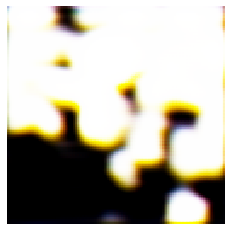

discriminator loss at step 300: 0.6672634
adversarial loss at step 300: 1.5005552


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


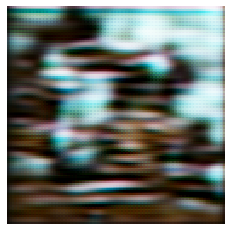

discriminator loss at step 310: 0.6910373
adversarial loss at step 310: 1.1976557


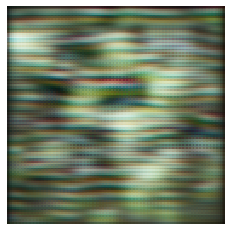

discriminator loss at step 320: 0.7024425
adversarial loss at step 320: 0.93586725


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


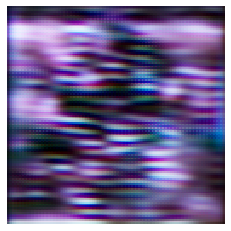

discriminator loss at step 330: 0.75396085
adversarial loss at step 330: 0.90432584


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


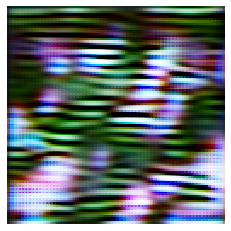

discriminator loss at step 340: 0.7098385
adversarial loss at step 340: 0.92030853


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


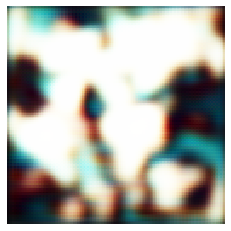

discriminator loss at step 350: 0.7856064
adversarial loss at step 350: 0.78602576


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


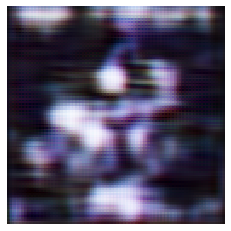

discriminator loss at step 360: 0.64639693
adversarial loss at step 360: 0.8521691


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


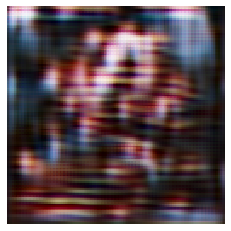

discriminator loss at step 370: 0.70566124
adversarial loss at step 370: 0.7926549


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


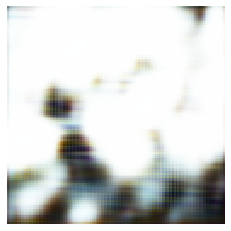

discriminator loss at step 380: 0.6689128
adversarial loss at step 380: 0.9221308


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


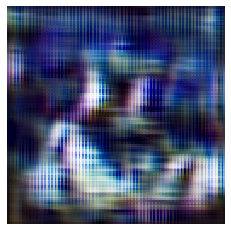

discriminator loss at step 390: 0.7027145
adversarial loss at step 390: 0.7678565


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


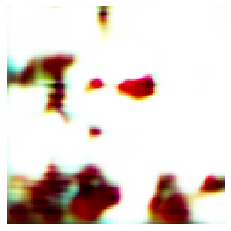

discriminator loss at step 400: 0.64798623
adversarial loss at step 400: 2.8685098


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


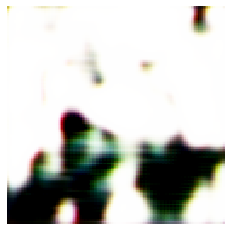

discriminator loss at step 410: 0.642514
adversarial loss at step 410: 0.86546135


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


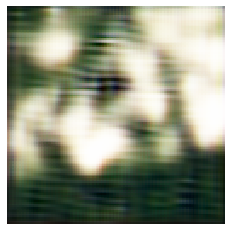

discriminator loss at step 420: 0.6614742
adversarial loss at step 420: 0.921381


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


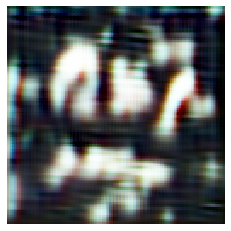

discriminator loss at step 430: 0.6609831
adversarial loss at step 430: 0.86551


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


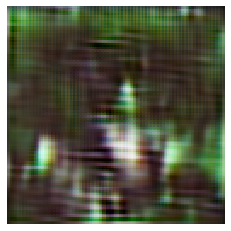

discriminator loss at step 440: 0.5516965
adversarial loss at step 440: 1.3278153


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


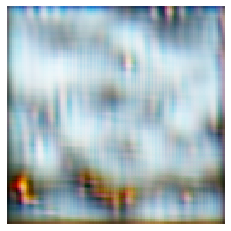

discriminator loss at step 450: 0.7403176
adversarial loss at step 450: 0.9670602


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


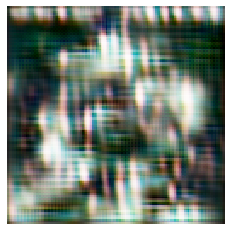

discriminator loss at step 460: 0.81676084
adversarial loss at step 460: 0.60743254


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


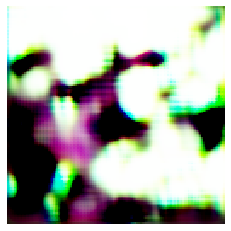

discriminator loss at step 470: 0.9176936
adversarial loss at step 470: 4.0151


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


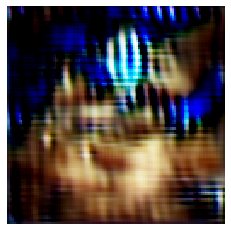

discriminator loss at step 480: 0.6134399
adversarial loss at step 480: 0.6194079


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


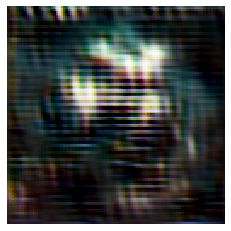

discriminator loss at step 490: 0.65906787
adversarial loss at step 490: 0.78147906


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


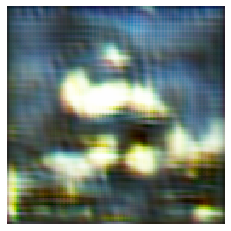

discriminator loss at step 500: 0.6864654
adversarial loss at step 500: 0.89794505


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


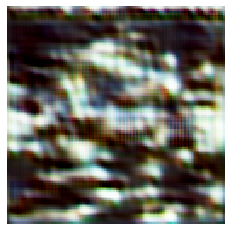

discriminator loss at step 510: 0.6799287
adversarial loss at step 510: 0.9919568


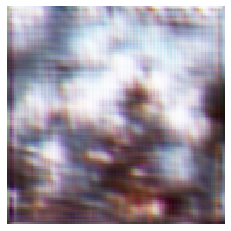

discriminator loss at step 520: 0.70001113
adversarial loss at step 520: 0.7280741


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


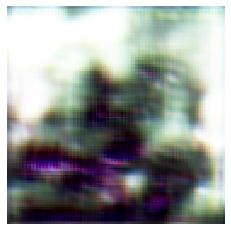

discriminator loss at step 530: 0.71697176
adversarial loss at step 530: 0.965693


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


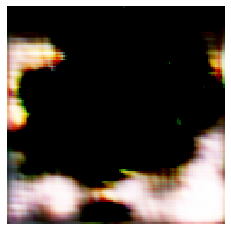

discriminator loss at step 540: 0.6708895
adversarial loss at step 540: 2.8522966


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


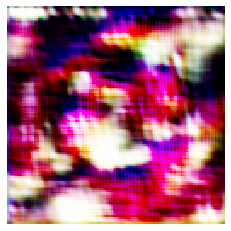

discriminator loss at step 550: 0.86796063
adversarial loss at step 550: 0.647387


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


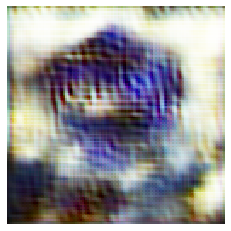

discriminator loss at step 560: 0.68707013
adversarial loss at step 560: 0.87277174


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


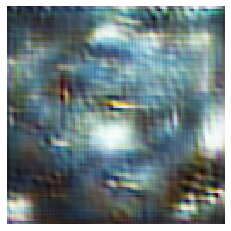

discriminator loss at step 570: 0.6610264
adversarial loss at step 570: 0.8565804


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


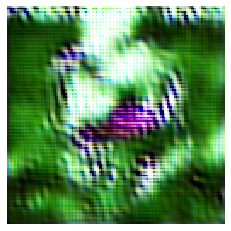

discriminator loss at step 580: 0.5908958
adversarial loss at step 580: 0.6562439


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


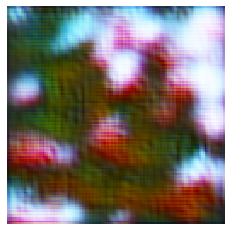

discriminator loss at step 590: 0.6229449
adversarial loss at step 590: 0.93900335


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


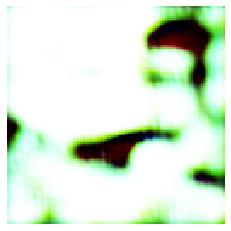

discriminator loss at step 600: 1.0975003
adversarial loss at step 600: 0.6964437


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


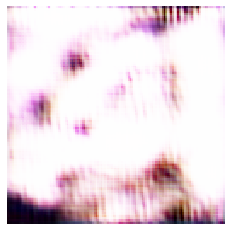

discriminator loss at step 610: 0.63965595
adversarial loss at step 610: 0.86018074


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


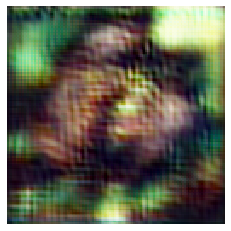

discriminator loss at step 620: 0.6400398
adversarial loss at step 620: 0.8759757


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


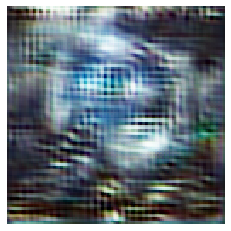

discriminator loss at step 630: 0.650849
adversarial loss at step 630: 0.7442782


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


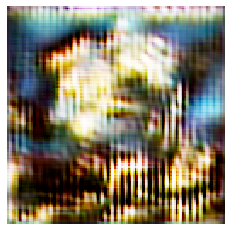

discriminator loss at step 640: 0.7188586
adversarial loss at step 640: 0.76804423


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


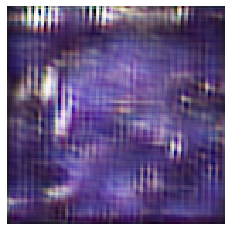

discriminator loss at step 650: 0.65075535
adversarial loss at step 650: 1.0842459


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


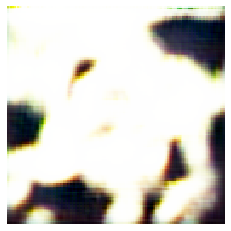

discriminator loss at step 660: 0.56509066
adversarial loss at step 660: 1.0541284


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


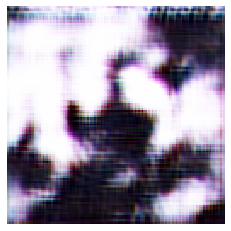

discriminator loss at step 670: 0.7328286
adversarial loss at step 670: 0.69004166


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


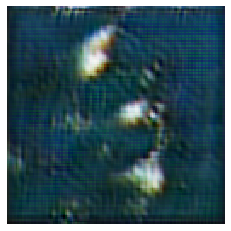

discriminator loss at step 680: 0.6628811
adversarial loss at step 680: 0.8556745


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


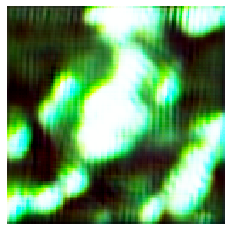

discriminator loss at step 690: 0.706818
adversarial loss at step 690: 0.32984704


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


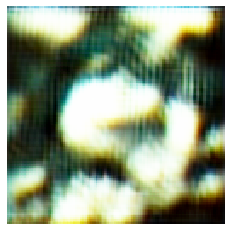

discriminator loss at step 700: 0.6626582
adversarial loss at step 700: 0.8937187


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


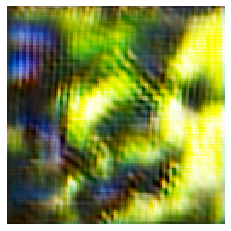

discriminator loss at step 710: 0.64833647
adversarial loss at step 710: 1.0046773


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


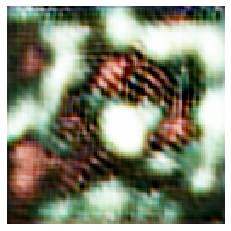

discriminator loss at step 720: 0.58868444
adversarial loss at step 720: 1.3794467


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


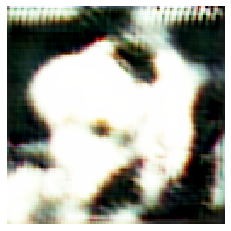

discriminator loss at step 730: 0.6362313
adversarial loss at step 730: 3.4019866


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


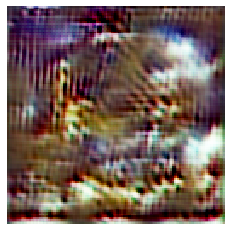

discriminator loss at step 740: 0.6127157
adversarial loss at step 740: 0.8005352


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


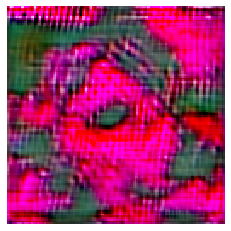

discriminator loss at step 750: 0.5038141
adversarial loss at step 750: 2.2459013


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


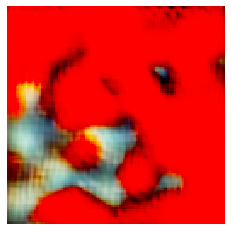

discriminator loss at step 760: -0.16756323
adversarial loss at step 760: 15.942385


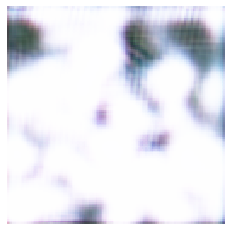

discriminator loss at step 770: 0.87038094
adversarial loss at step 770: 0.78235537


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


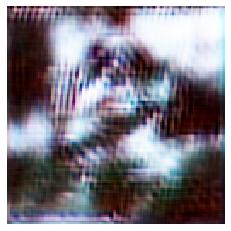

discriminator loss at step 780: 0.61095923
adversarial loss at step 780: 0.98329806


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


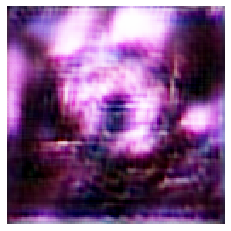

discriminator loss at step 790: 0.79997253
adversarial loss at step 790: 0.9420873


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


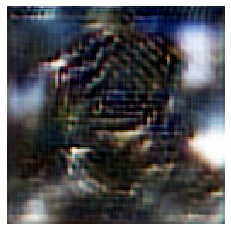

discriminator loss at step 800: 0.5984992
adversarial loss at step 800: 0.760589


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


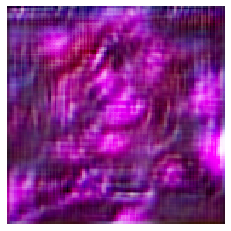

discriminator loss at step 810: 0.68427086
adversarial loss at step 810: 15.942385


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


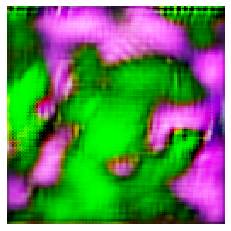

discriminator loss at step 820: 0.15426508
adversarial loss at step 820: 14.67154


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


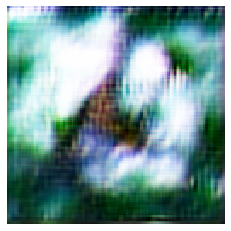

discriminator loss at step 830: 0.7147569
adversarial loss at step 830: 0.8245001


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


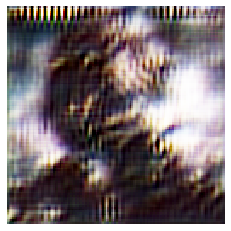

discriminator loss at step 840: 0.6282157
adversarial loss at step 840: 0.878508


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


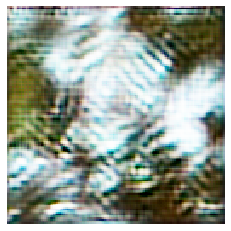

discriminator loss at step 850: 0.73424673
adversarial loss at step 850: 1.3601661


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


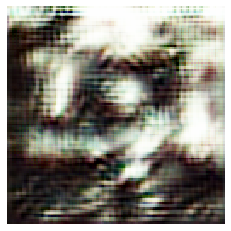

discriminator loss at step 860: 0.7456944
adversarial loss at step 860: 0.6002071


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


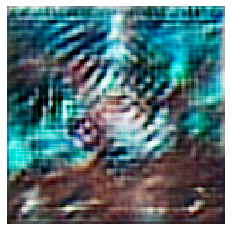

discriminator loss at step 870: 0.69485176
adversarial loss at step 870: 0.87146413


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


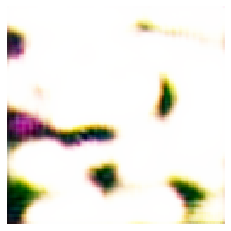

discriminator loss at step 880: 1.1164614
adversarial loss at step 880: 2.846819


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


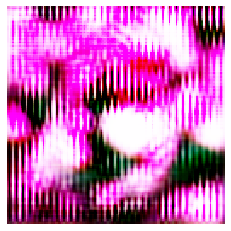

discriminator loss at step 890: 1.0781455
adversarial loss at step 890: 3.3765697


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


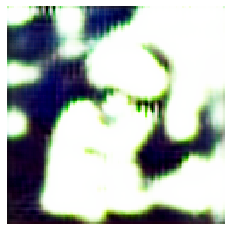

discriminator loss at step 900: 0.53121376
adversarial loss at step 900: 1.0887444


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


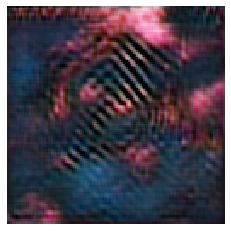

discriminator loss at step 910: 0.7483554
adversarial loss at step 910: 0.9951092


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


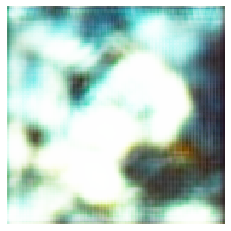

discriminator loss at step 920: 0.7936042
adversarial loss at step 920: 0.80829954


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


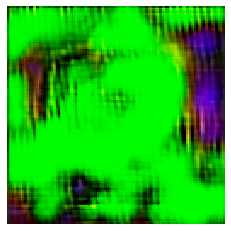

discriminator loss at step 930: 2.9789405
adversarial loss at step 930: 11.795658


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


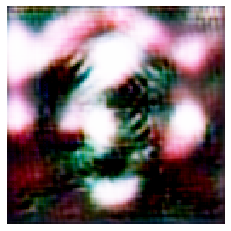

discriminator loss at step 940: 0.20372957
adversarial loss at step 940: 2.5457


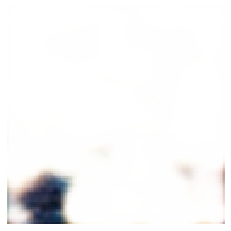

discriminator loss at step 950: 0.15758729
adversarial loss at step 950: 1.0308335


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


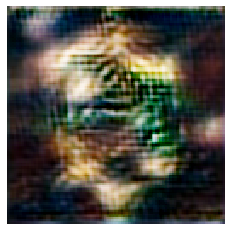

discriminator loss at step 960: 0.6587389
adversarial loss at step 960: 0.8210509


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


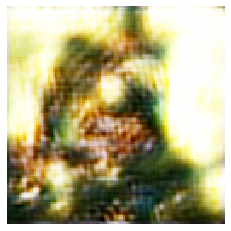

discriminator loss at step 970: 0.75587595
adversarial loss at step 970: 1.4707308


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


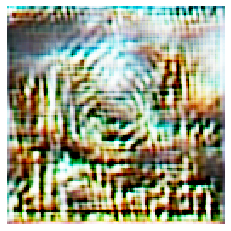

discriminator loss at step 980: 0.65619934
adversarial loss at step 980: 0.7856128


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


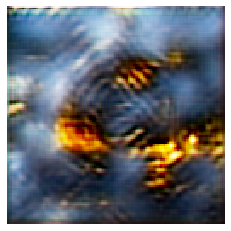

discriminator loss at step 990: 0.70098674
adversarial loss at step 990: 0.87279373


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


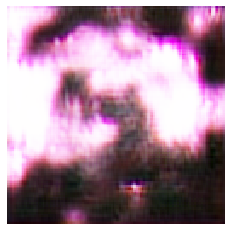

discriminator loss at step 1000: 0.6600215
adversarial loss at step 1000: 1.3268942


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


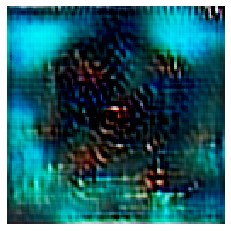

discriminator loss at step 1010: 0.7040462
adversarial loss at step 1010: 2.6218195


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


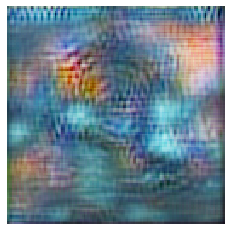

discriminator loss at step 1020: 0.71901286
adversarial loss at step 1020: 0.65297353


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


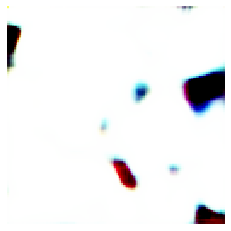

discriminator loss at step 1030: 0.28650427
adversarial loss at step 1030: 10.01299


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


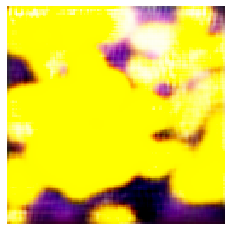

discriminator loss at step 1040: 0.4044782
adversarial loss at step 1040: 3.152846


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


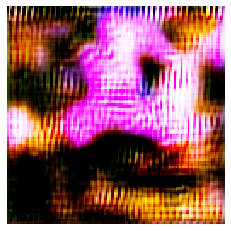

discriminator loss at step 1050: 0.5962501
adversarial loss at step 1050: 9.784855


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


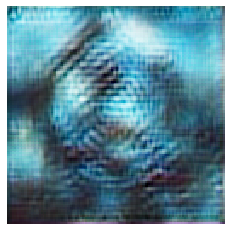

discriminator loss at step 1060: 0.6430452
adversarial loss at step 1060: 0.9866768


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


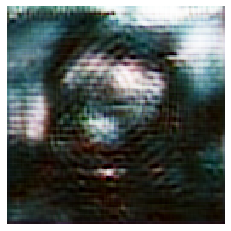

discriminator loss at step 1070: 0.70228446
adversarial loss at step 1070: 1.1653154


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


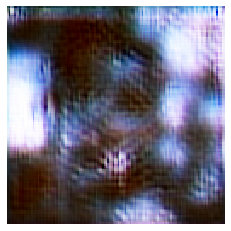

discriminator loss at step 1080: 0.8027687
adversarial loss at step 1080: 1.0676061


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


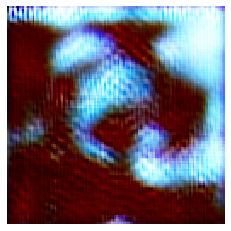

discriminator loss at step 1090: 0.7200631
adversarial loss at step 1090: 1.0488256


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


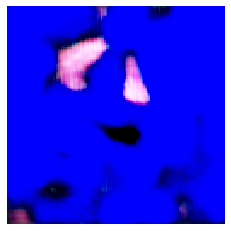

discriminator loss at step 1100: -0.13139255
adversarial loss at step 1100: 15.942385


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


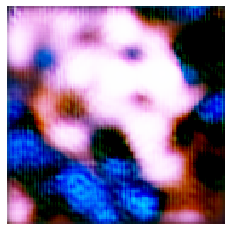

discriminator loss at step 1110: -0.10843475
adversarial loss at step 1110: 15.472235


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


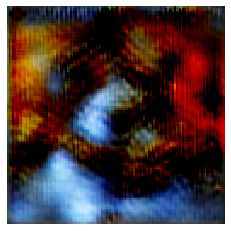

discriminator loss at step 1120: 0.7151083
adversarial loss at step 1120: 2.1905675


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


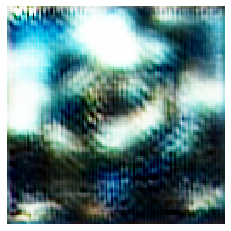

discriminator loss at step 1130: 0.8963542
adversarial loss at step 1130: 1.0004462


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


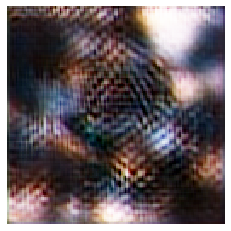

discriminator loss at step 1140: 0.6245897
adversarial loss at step 1140: 1.3571484


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


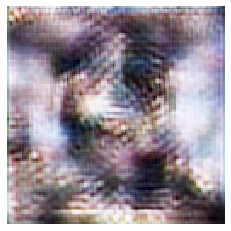

discriminator loss at step 1150: 0.6816408
adversarial loss at step 1150: 1.0574722


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


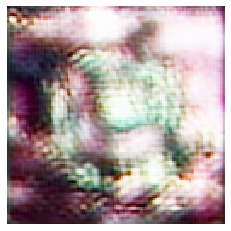

discriminator loss at step 1160: 0.7179909
adversarial loss at step 1160: 1.2728199


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


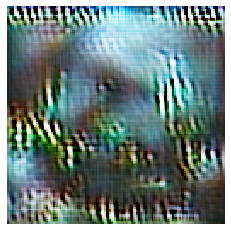

discriminator loss at step 1170: 0.647004
adversarial loss at step 1170: 1.0948154


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


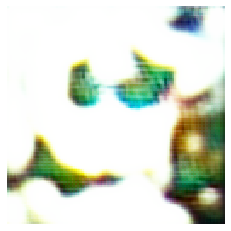

discriminator loss at step 1180: 1.2003486
adversarial loss at step 1180: 5.5593987


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


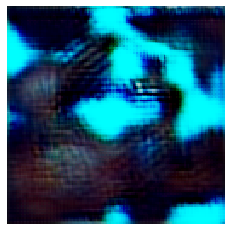

discriminator loss at step 1190: 0.5163696
adversarial loss at step 1190: 2.1729817


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


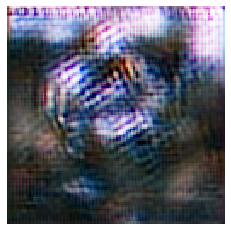

discriminator loss at step 1200: 0.79043984
adversarial loss at step 1200: 0.7924431


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


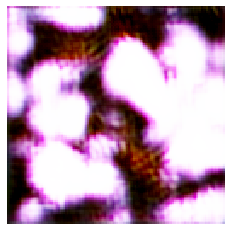

discriminator loss at step 1210: 0.7429233
adversarial loss at step 1210: 2.3868897


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


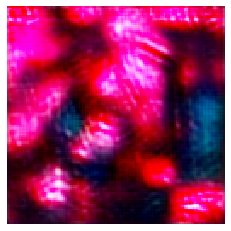

discriminator loss at step 1220: 0.7323972
adversarial loss at step 1220: 3.4532104


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


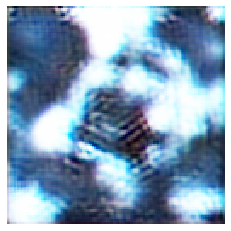

discriminator loss at step 1230: 0.7097189
adversarial loss at step 1230: 2.5187488


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


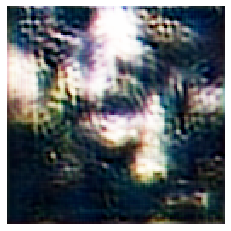

discriminator loss at step 1240: 0.77693355
adversarial loss at step 1240: 1.3494812


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


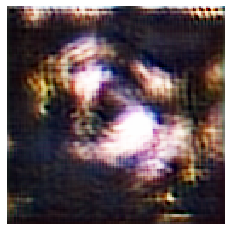

discriminator loss at step 1250: 0.81279576
adversarial loss at step 1250: 0.5588527


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


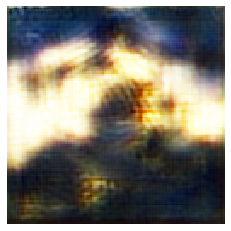

discriminator loss at step 1260: 0.6877613
adversarial loss at step 1260: 0.7716396


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


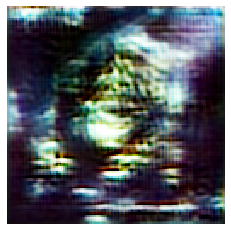

discriminator loss at step 1270: 0.64946187
adversarial loss at step 1270: 1.234561


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


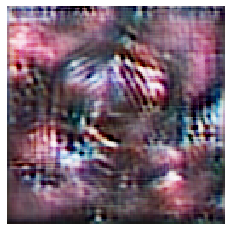

discriminator loss at step 1280: 0.6785395
adversarial loss at step 1280: 0.572987


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


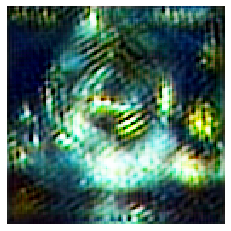

discriminator loss at step 1290: 0.8861134
adversarial loss at step 1290: 0.75064325


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


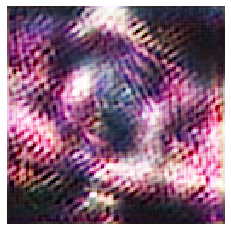

discriminator loss at step 1300: 1.1446948
adversarial loss at step 1300: 1.0186346


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


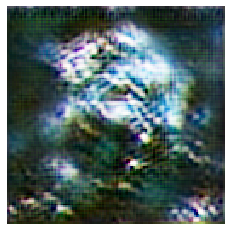

discriminator loss at step 1310: 0.67426884
adversarial loss at step 1310: 0.73670214


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


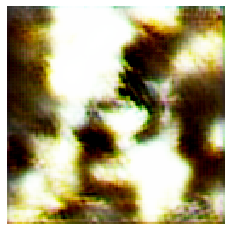

discriminator loss at step 1320: 0.71470755
adversarial loss at step 1320: 0.5352956


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


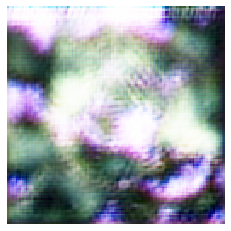

discriminator loss at step 1330: 2.4525137
adversarial loss at step 1330: 0.32368043


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


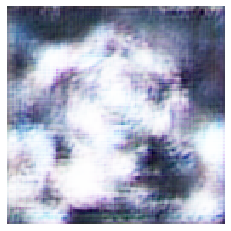

discriminator loss at step 1340: 0.5787859
adversarial loss at step 1340: 1.0509763


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


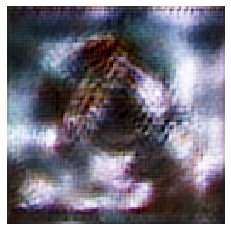

discriminator loss at step 1350: 0.69401264
adversarial loss at step 1350: 0.7405059


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


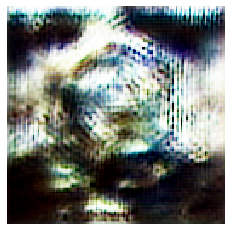

discriminator loss at step 1360: 0.7322678
adversarial loss at step 1360: 0.78144836


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


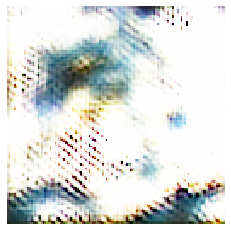

discriminator loss at step 1370: 0.63676363
adversarial loss at step 1370: 0.9799051


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


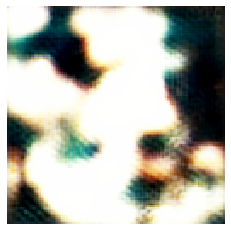

discriminator loss at step 1380: 0.7134214
adversarial loss at step 1380: 0.97716117


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


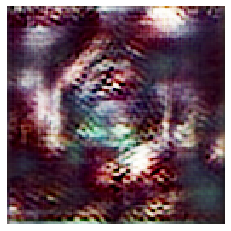

discriminator loss at step 1390: 0.82256037
adversarial loss at step 1390: 0.6485279


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


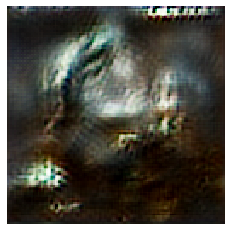

discriminator loss at step 1400: 0.7092105
adversarial loss at step 1400: 0.6491666


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


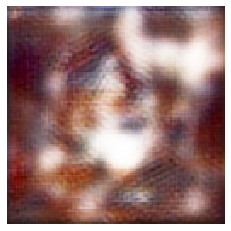

discriminator loss at step 1410: 0.6042234
adversarial loss at step 1410: 1.0275515


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


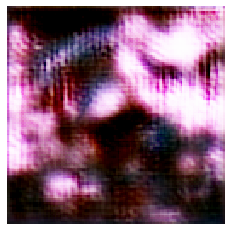

discriminator loss at step 1420: 1.0103161
adversarial loss at step 1420: 1.4657457


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


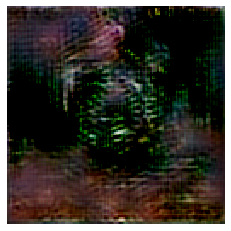

discriminator loss at step 1430: 0.7301844
adversarial loss at step 1430: 0.79893243


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


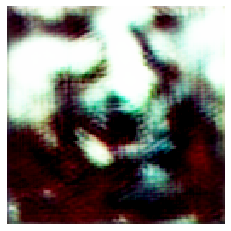

discriminator loss at step 1440: 1.3752497
adversarial loss at step 1440: 0.47751114


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


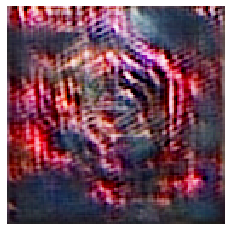

discriminator loss at step 1450: 0.7616519
adversarial loss at step 1450: 0.84089744


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


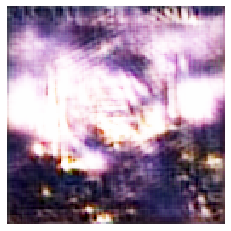

discriminator loss at step 1460: 0.68450594
adversarial loss at step 1460: 0.4934282


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


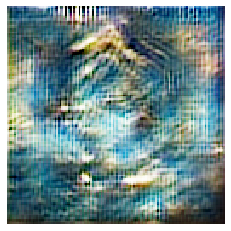

discriminator loss at step 1470: 0.6360637
adversarial loss at step 1470: 0.84322786


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


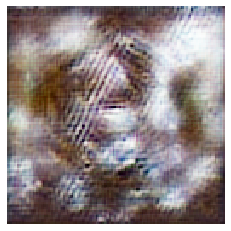

discriminator loss at step 1480: 0.7017313
adversarial loss at step 1480: 1.0692306


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


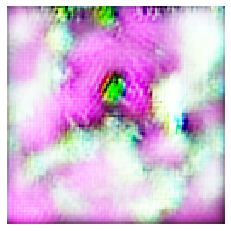

discriminator loss at step 1490: 0.45898336
adversarial loss at step 1490: 1.7761121


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


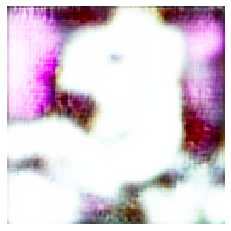

discriminator loss at step 1500: 0.36448216
adversarial loss at step 1500: 2.8173232


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


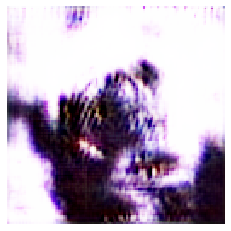

discriminator loss at step 1510: 0.55306417
adversarial loss at step 1510: 1.0581766


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


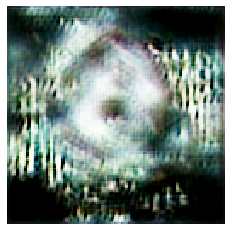

discriminator loss at step 1520: 0.6153058
adversarial loss at step 1520: 1.1243751


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


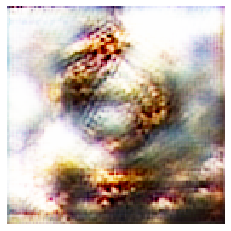

discriminator loss at step 1530: 0.7298321
adversarial loss at step 1530: 0.7804166


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


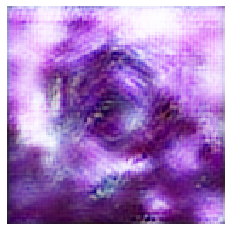

discriminator loss at step 1540: 0.45447996
adversarial loss at step 1540: 2.0670557


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


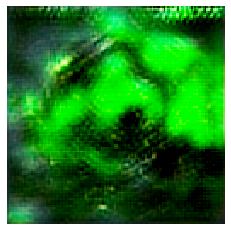

discriminator loss at step 1550: 0.56253767
adversarial loss at step 1550: 1.813085


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


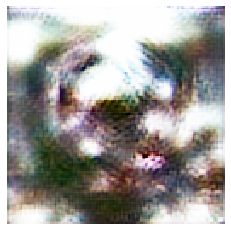

discriminator loss at step 1560: 0.6117735
adversarial loss at step 1560: 0.6294944


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


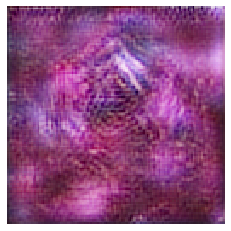

discriminator loss at step 1570: 0.6711841
adversarial loss at step 1570: 15.942385


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


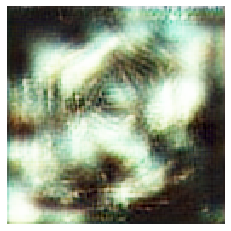

discriminator loss at step 1580: 0.6282414
adversarial loss at step 1580: 0.8851129


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


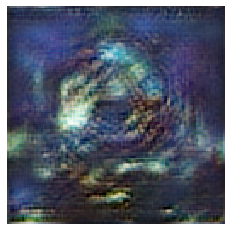

discriminator loss at step 1590: 0.74900347
adversarial loss at step 1590: 0.50818956


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


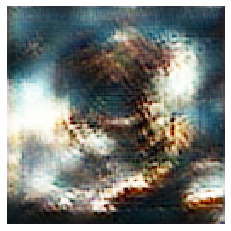

discriminator loss at step 1600: 0.6931677
adversarial loss at step 1600: 0.686475


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


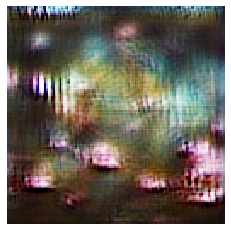

discriminator loss at step 1610: 0.6429199
adversarial loss at step 1610: 1.0490997


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


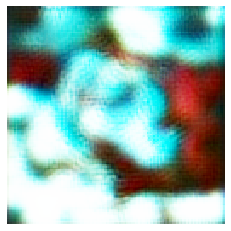

discriminator loss at step 1620: 0.8181691
adversarial loss at step 1620: 0.75349355


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


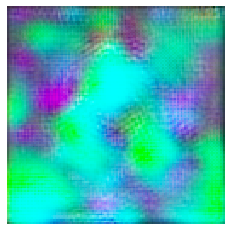

discriminator loss at step 1630: -0.058091953
adversarial loss at step 1630: 15.942385


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


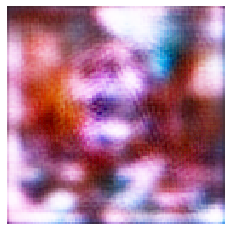

discriminator loss at step 1640: 0.78425604
adversarial loss at step 1640: 1.0153146


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


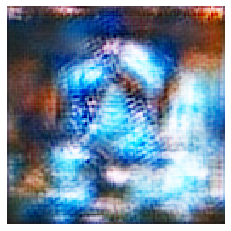

discriminator loss at step 1650: 0.6232536
adversarial loss at step 1650: 1.0160198


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


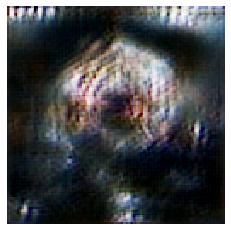

discriminator loss at step 1660: 0.6106903
adversarial loss at step 1660: 0.7585839


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


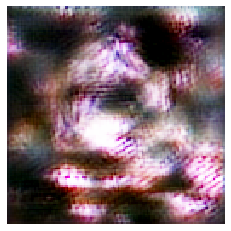

discriminator loss at step 1670: 0.59322584
adversarial loss at step 1670: 0.96056384


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


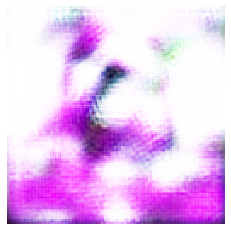

discriminator loss at step 1680: 0.73393315
adversarial loss at step 1680: 15.942385


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


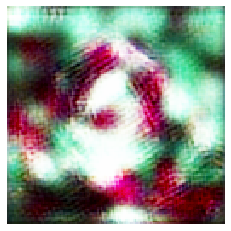

discriminator loss at step 1690: 0.6806618
adversarial loss at step 1690: 1.5879326


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


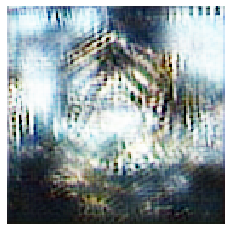

discriminator loss at step 1700: 0.7079716
adversarial loss at step 1700: 0.727798


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


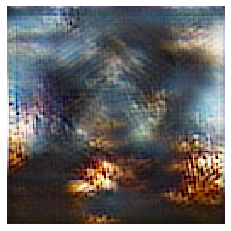

discriminator loss at step 1710: 0.7135285
adversarial loss at step 1710: 0.695987


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


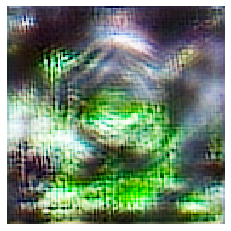

discriminator loss at step 1720: 0.8138571
adversarial loss at step 1720: 0.6120801


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


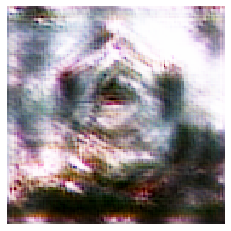

discriminator loss at step 1730: 0.6928789
adversarial loss at step 1730: 0.5511212


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


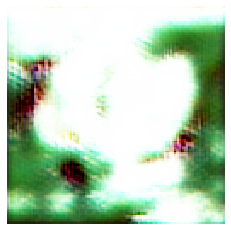

discriminator loss at step 1740: 0.67472893
adversarial loss at step 1740: 0.6716206


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


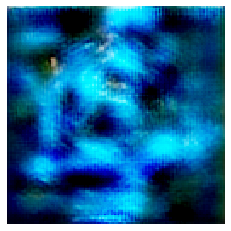

discriminator loss at step 1750: 0.71672416
adversarial loss at step 1750: 0.9375848


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


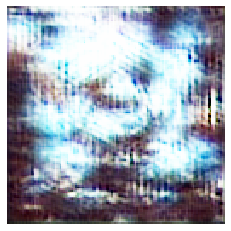

discriminator loss at step 1760: 0.6902058
adversarial loss at step 1760: 1.3335373


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


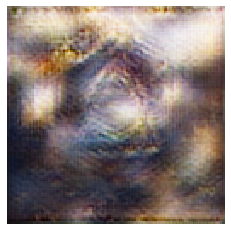

discriminator loss at step 1770: 0.7059754
adversarial loss at step 1770: 0.9474158


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


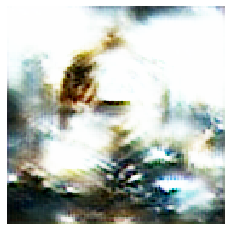

discriminator loss at step 1780: 0.72317016
adversarial loss at step 1780: 0.7347635


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


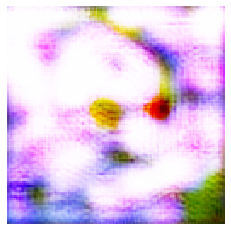

discriminator loss at step 1790: 0.30694354
adversarial loss at step 1790: 8.565483


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


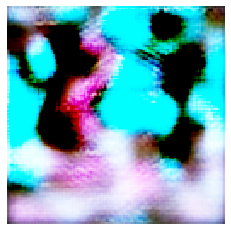

discriminator loss at step 1800: 0.42971238
adversarial loss at step 1800: 4.5229073


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


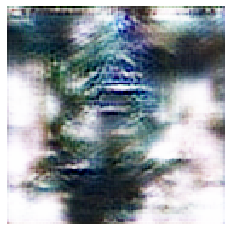

discriminator loss at step 1810: 0.7913409
adversarial loss at step 1810: 0.9557878


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


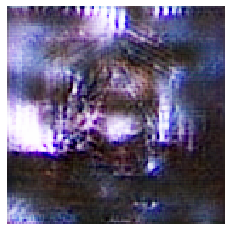

discriminator loss at step 1820: 0.887249
adversarial loss at step 1820: 0.89952666


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


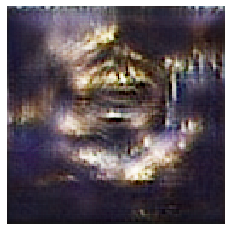

discriminator loss at step 1830: 0.65334195
adversarial loss at step 1830: 0.8661737


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


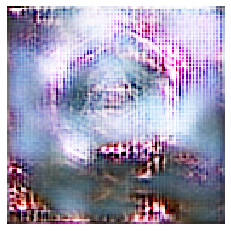

discriminator loss at step 1840: 0.7465254
adversarial loss at step 1840: 0.47075477


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


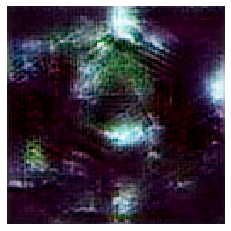

discriminator loss at step 1850: 0.51176816
adversarial loss at step 1850: 3.2870677


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


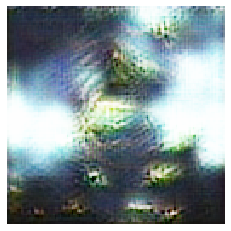

discriminator loss at step 1860: 0.7621387
adversarial loss at step 1860: 1.1628219


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


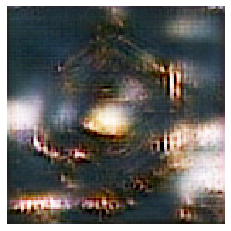

discriminator loss at step 1870: 0.64837384
adversarial loss at step 1870: 0.9021007


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


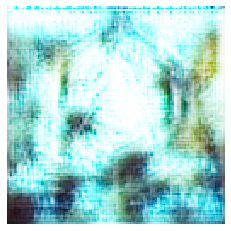

discriminator loss at step 1880: 0.7604392
adversarial loss at step 1880: 0.5391872


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


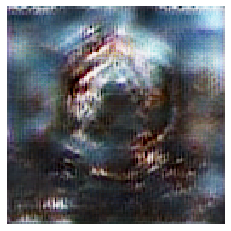

discriminator loss at step 1890: 0.73360556
adversarial loss at step 1890: 0.5771352


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


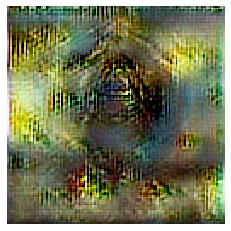

discriminator loss at step 1900: 0.76186216
adversarial loss at step 1900: 0.67524093


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


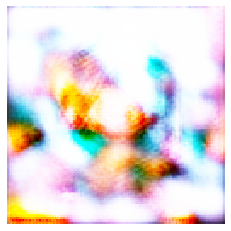

discriminator loss at step 1910: 0.92584103
adversarial loss at step 1910: 6.1516047


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


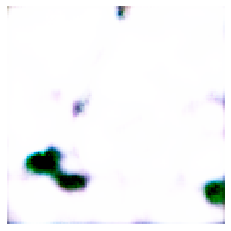

discriminator loss at step 1920: 0.17310992
adversarial loss at step 1920: 2.1253242


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


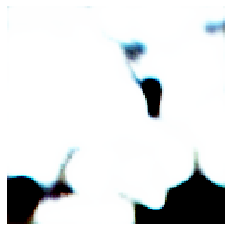

discriminator loss at step 1930: 0.041608427
adversarial loss at step 1930: 9.652919


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


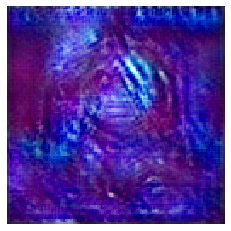

discriminator loss at step 1940: 0.6523409
adversarial loss at step 1940: 1.4634088


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


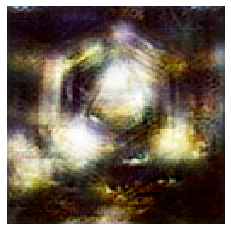

discriminator loss at step 1950: 0.78667575
adversarial loss at step 1950: 0.64600354


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


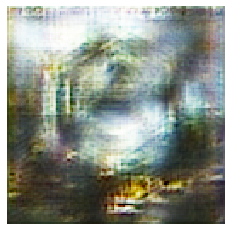

discriminator loss at step 1960: 0.67627484
adversarial loss at step 1960: 1.0718312


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


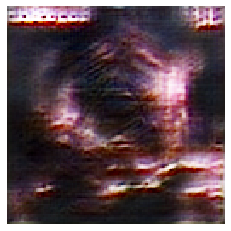

discriminator loss at step 1970: 0.74276435
adversarial loss at step 1970: 1.1343879


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


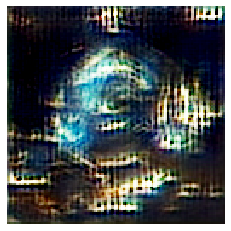

discriminator loss at step 1980: 0.9426669
adversarial loss at step 1980: 0.33968103


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


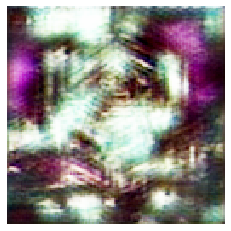

discriminator loss at step 1990: 1.185088
adversarial loss at step 1990: 1.3100734


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


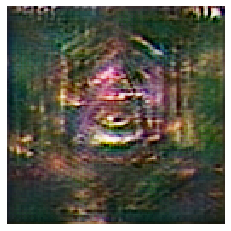

discriminator loss at step 2000: 0.5281645
adversarial loss at step 2000: 0.106137134


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


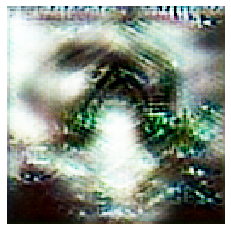

discriminator loss at step 2010: 0.76539457
adversarial loss at step 2010: 0.79718345


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


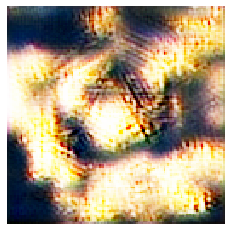

discriminator loss at step 2020: 0.6578284
adversarial loss at step 2020: 0.8282197


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


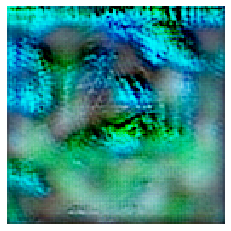

discriminator loss at step 2030: 0.8282247
adversarial loss at step 2030: 14.53663


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


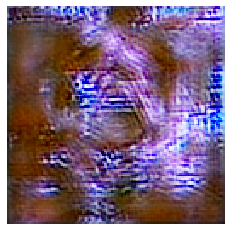

discriminator loss at step 2040: 0.6627413
adversarial loss at step 2040: 1.4287447


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


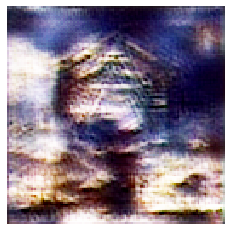

discriminator loss at step 2050: 0.6773453
adversarial loss at step 2050: 0.6400734


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


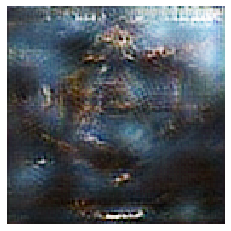

discriminator loss at step 2060: 0.5988946
adversarial loss at step 2060: 0.93521446


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


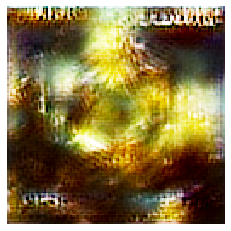

discriminator loss at step 2070: 0.5716773
adversarial loss at step 2070: 0.79384


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


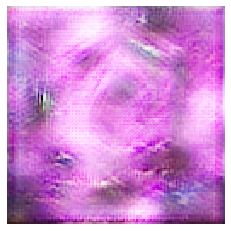

discriminator loss at step 2080: 0.6427047
adversarial loss at step 2080: 1.1222324


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


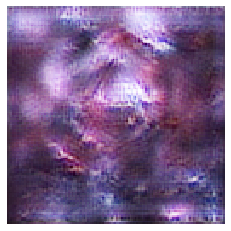

discriminator loss at step 2090: 0.62722456
adversarial loss at step 2090: 1.486239


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


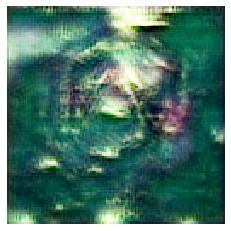

discriminator loss at step 2100: 0.8946361
adversarial loss at step 2100: 0.24927184


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


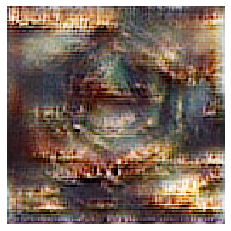

discriminator loss at step 2110: 0.6974895
adversarial loss at step 2110: 0.94038355


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


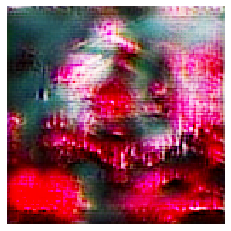

discriminator loss at step 2120: 0.7118378
adversarial loss at step 2120: 0.83601844


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


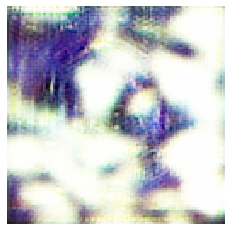

discriminator loss at step 2130: 2.7284343
adversarial loss at step 2130: 0.52626747


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


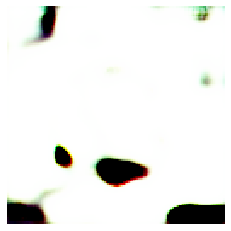

discriminator loss at step 2140: 0.24193741
adversarial loss at step 2140: 9.795821


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


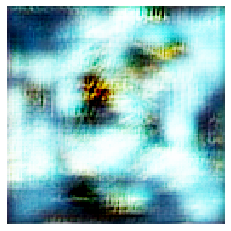

discriminator loss at step 2150: 0.27593344
adversarial loss at step 2150: 0.8028257


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


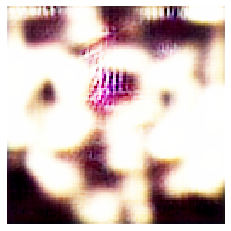

discriminator loss at step 2160: 0.6768967
adversarial loss at step 2160: 3.2815838


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


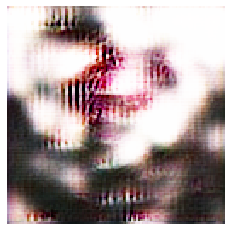

discriminator loss at step 2170: 0.8032793
adversarial loss at step 2170: 1.0177026


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


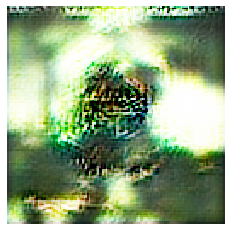

discriminator loss at step 2180: 0.45627642
adversarial loss at step 2180: 2.1107059


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


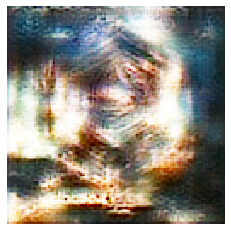

discriminator loss at step 2190: 0.64208364
adversarial loss at step 2190: 1.0918286


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


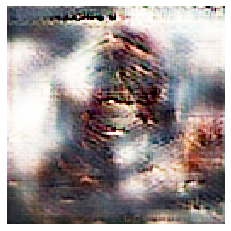

discriminator loss at step 2200: 0.6338996
adversarial loss at step 2200: 0.75199896


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


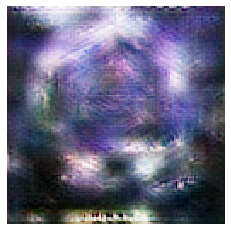

discriminator loss at step 2210: 0.74703276
adversarial loss at step 2210: 1.3469161


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


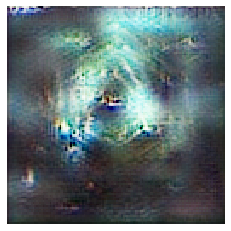

discriminator loss at step 2220: 0.7345003
adversarial loss at step 2220: 0.960271


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


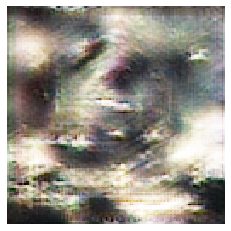

discriminator loss at step 2230: 0.79379237
adversarial loss at step 2230: 0.66212213


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


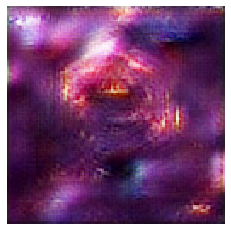

discriminator loss at step 2240: 3.7174265
adversarial loss at step 2240: 12.5707245


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


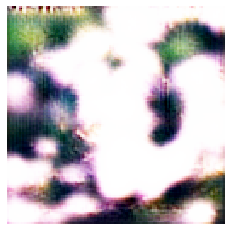

discriminator loss at step 2250: 0.34990495
adversarial loss at step 2250: 11.124229


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


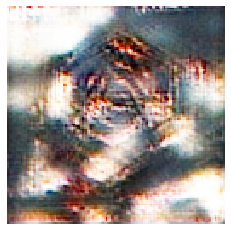

discriminator loss at step 2260: 0.62542737
adversarial loss at step 2260: 0.92232776


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


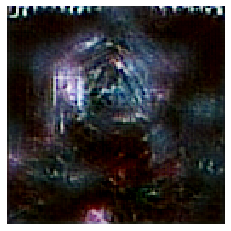

discriminator loss at step 2270: 0.47077402
adversarial loss at step 2270: 1.7470764


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


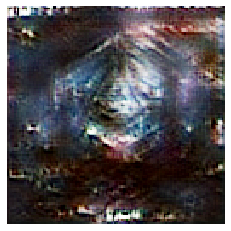

discriminator loss at step 2280: 0.6621554
adversarial loss at step 2280: 1.0029551


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


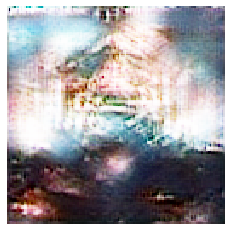

discriminator loss at step 2290: 0.695002
adversarial loss at step 2290: 0.74359596


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


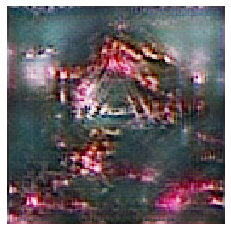

discriminator loss at step 2300: 0.6764152
adversarial loss at step 2300: 0.9181776


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


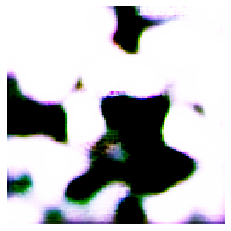

discriminator loss at step 2310: -0.005355358
adversarial loss at step 2310: 15.891702


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


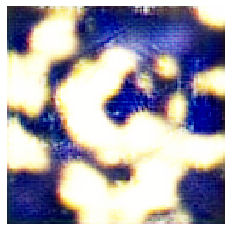

discriminator loss at step 2320: 0.428247
adversarial loss at step 2320: 2.9424808


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


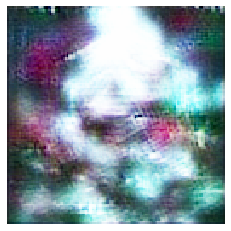

discriminator loss at step 2330: 0.3607588
adversarial loss at step 2330: 1.5069556


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


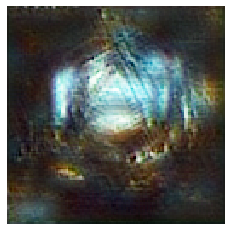

discriminator loss at step 2340: 0.6256685
adversarial loss at step 2340: 0.941133


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


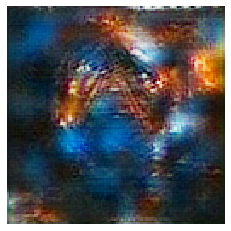

discriminator loss at step 2350: 0.69644773
adversarial loss at step 2350: 0.91344434


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


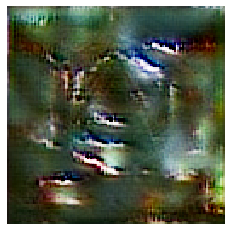

discriminator loss at step 2360: 0.9206097
adversarial loss at step 2360: 1.7439699


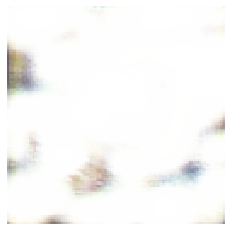

discriminator loss at step 2370: 0.90711427
adversarial loss at step 2370: 2.258496


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


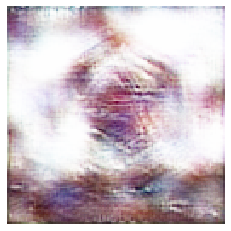

discriminator loss at step 2380: 0.64456254
adversarial loss at step 2380: 1.0040988


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


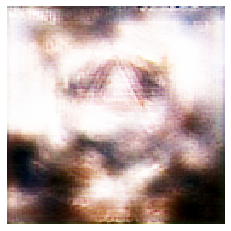

discriminator loss at step 2390: 0.6272397
adversarial loss at step 2390: 0.79567313


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


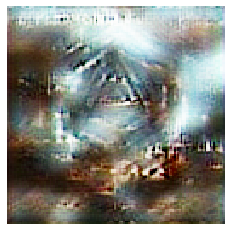

discriminator loss at step 2400: 0.6642459
adversarial loss at step 2400: 0.9211787


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


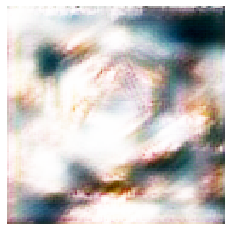

discriminator loss at step 2410: 0.66169137
adversarial loss at step 2410: 0.94437057


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


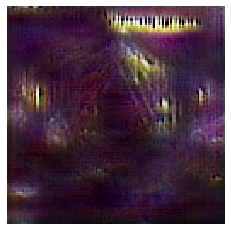

discriminator loss at step 2420: 0.8944018
adversarial loss at step 2420: 1.6644118


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


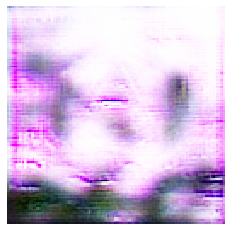

discriminator loss at step 2430: 0.8022585
adversarial loss at step 2430: 1.4081239


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


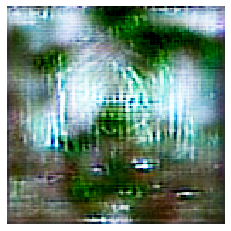

discriminator loss at step 2440: 2.8578222
adversarial loss at step 2440: 0.8431713


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


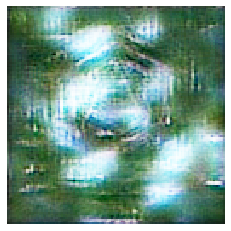

discriminator loss at step 2450: 1.0922154
adversarial loss at step 2450: 0.89013565


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


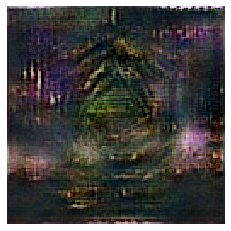

discriminator loss at step 2460: 0.6382489
adversarial loss at step 2460: 0.6255973


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


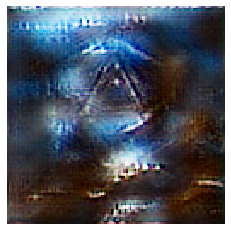

discriminator loss at step 2470: 0.71376723
adversarial loss at step 2470: 0.7337161


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


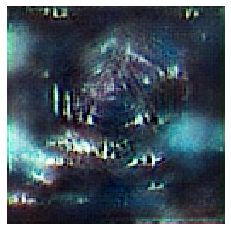

discriminator loss at step 2480: 0.65025544
adversarial loss at step 2480: 0.8294724


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


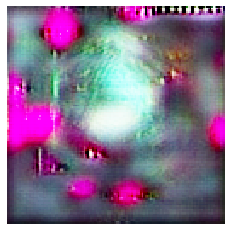

discriminator loss at step 2490: -0.14206207
adversarial loss at step 2490: 13.970379


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


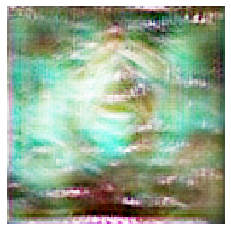

discriminator loss at step 2500: 0.9688153
adversarial loss at step 2500: 0.4638002


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


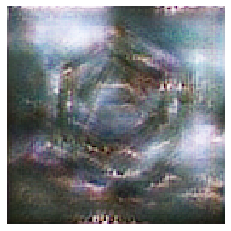

discriminator loss at step 2510: 0.7839546
adversarial loss at step 2510: 1.0381794


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


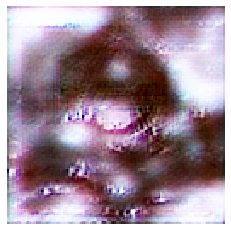

discriminator loss at step 2520: 1.6430796
adversarial loss at step 2520: 1.4612259


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


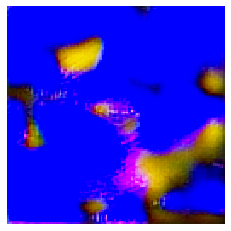

discriminator loss at step 2530: 0.5255445
adversarial loss at step 2530: 4.534831


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


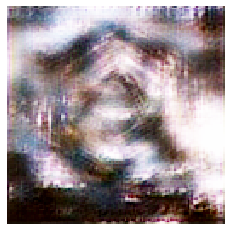

discriminator loss at step 2540: 0.728623
adversarial loss at step 2540: 0.76453185


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


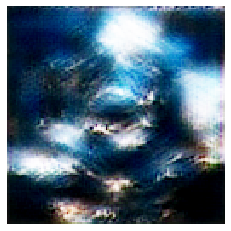

discriminator loss at step 2550: 0.60627913
adversarial loss at step 2550: 0.979766


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


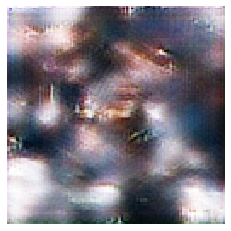

discriminator loss at step 2560: 0.7034008
adversarial loss at step 2560: 0.99185365


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


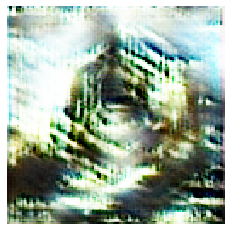

discriminator loss at step 2570: 0.7091961
adversarial loss at step 2570: 0.69771904


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


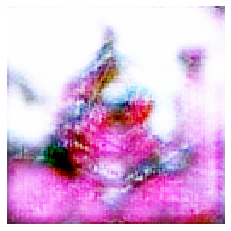

discriminator loss at step 2580: 5.298568
adversarial loss at step 2580: 0.8022709


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


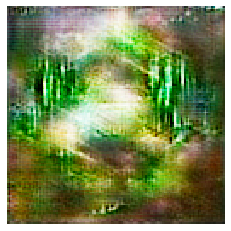

discriminator loss at step 2590: 1.0453868
adversarial loss at step 2590: 1.9839252


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


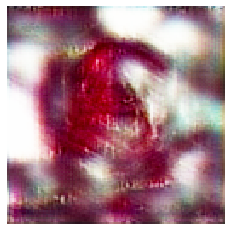

discriminator loss at step 2600: 0.16953166
adversarial loss at step 2600: 2.605762


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


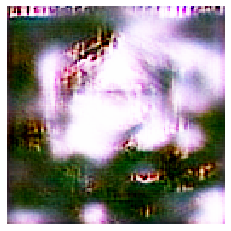

discriminator loss at step 2610: 0.71517205
adversarial loss at step 2610: 1.3005197


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


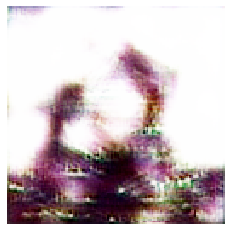

discriminator loss at step 2620: 0.6316452
adversarial loss at step 2620: 2.9347754


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


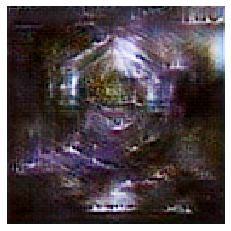

discriminator loss at step 2630: 0.8082609
adversarial loss at step 2630: 0.74726737


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


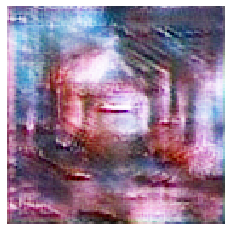

discriminator loss at step 2640: 0.5425851
adversarial loss at step 2640: 0.50802135


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


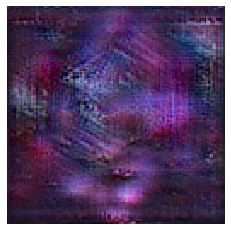

discriminator loss at step 2650: 0.6224879
adversarial loss at step 2650: 2.078635


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


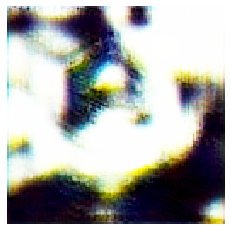

discriminator loss at step 2660: 0.5092534
adversarial loss at step 2660: 1.3261507


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


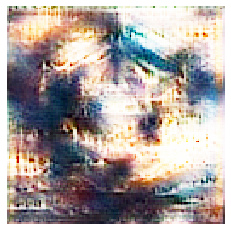

discriminator loss at step 2670: 0.62197185
adversarial loss at step 2670: 0.98992884


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


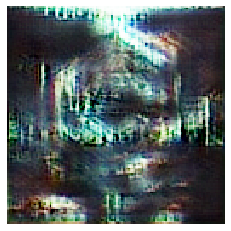

discriminator loss at step 2680: 0.65387726
adversarial loss at step 2680: 0.52035034


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


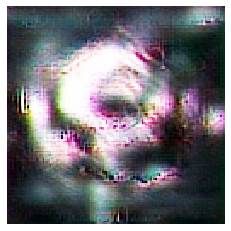

discriminator loss at step 2690: 0.8178137
adversarial loss at step 2690: 1.7245066


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


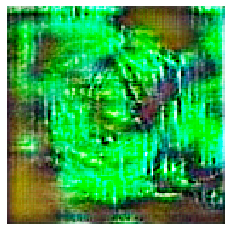

discriminator loss at step 2700: 0.5140562
adversarial loss at step 2700: 2.1550825


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


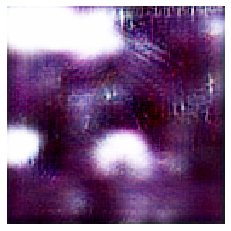

discriminator loss at step 2710: 0.7120052
adversarial loss at step 2710: 1.8647821


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


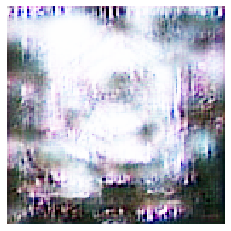

discriminator loss at step 2720: 0.42684817
adversarial loss at step 2720: 1.6822685


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


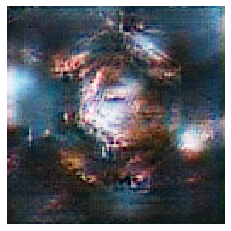

discriminator loss at step 2730: 0.67187846
adversarial loss at step 2730: 1.1477008


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


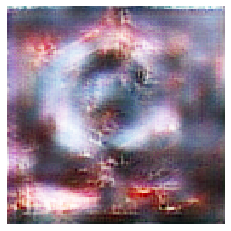

discriminator loss at step 2740: 0.6503059
adversarial loss at step 2740: 0.8158475


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


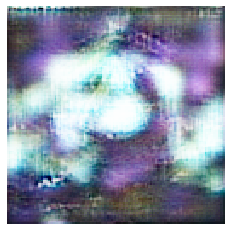

discriminator loss at step 2750: 1.1006136
adversarial loss at step 2750: 0.3603668


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


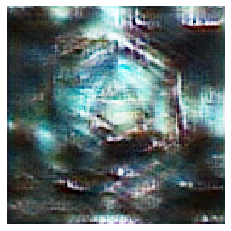

discriminator loss at step 2760: 1.0593996
adversarial loss at step 2760: 0.4537258


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [0]:
start = 0
for step in range(iterations):
    # Sample random points in the latent space
    random_latent_vectors = np.random.normal(size=(batch_size, latent_dim))

    # Decode them to fake images
    generated_images = generator.predict(random_latent_vectors)

    # Combine them with real images
    stop = start + batch_size
    real_images = x_train[start: stop]
    combined_images = np.concatenate([generated_images, real_images])

    # Assemble labels discriminating real from fake images
    labels = np.concatenate([np.ones((batch_size, 1)),
                             np.zeros((batch_size, 1))])
    # Add random noise to the labels - important trick!
    labels += 0.05 * np.random.random(labels.shape)

    # Train the discriminator
    d_loss = discriminator.train_on_batch(combined_images, labels)

    # sample random points in the latent space
    random_latent_vectors = np.random.normal(size=(batch_size, latent_dim))

    # Assemble labels that say "all real images"
    misleading_targets = np.zeros((batch_size, 1))

    # Train the generator (via the gan model,
    # where the discriminator weights are frozen)
    a_loss = gan.train_on_batch(random_latent_vectors, misleading_targets)
    
    start += batch_size
    if start > len(x_train) - batch_size:
      start = 0

    # Occasionally save / plot
    if step % 10 == 0:
        # Save model weights
        gan.save_weights('gan.h5')
        plt.imshow(generator.predict(random_latent_vectors)[0])
        plt.axis('off')
        plt.show()
        # Print metrics
        print('discriminator loss at step %s: %s' % (step, d_loss))
        print('adversarial loss at step %s: %s' % (step, a_loss))

In [0]:
random_latent_vectors = np.random.normal(size=(batch_size, latent_dim))
predicted_images = generator.predict(random_latent_vectors)

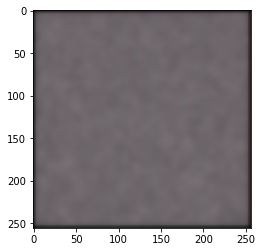

In [0]:
plt.imshow(predicted_images[4])